I think we need to agree on how we store the data, for now I stored the data as shown below

![Data Format](data_store.png)

In [3]:
# Removed unused imports
import os
import random


import numpy  as np
import pandas as pd


import matplotlib.pyplot as plt


from PIL import Image

from torch.utils.data import Dataset

In [4]:
def get_art_styles(root_dir):
    styles = []
    for style in os.listdir(root_dir):
        style_dir = os.path.join(root_dir, style)
        if os.path.isdir(style_dir):
            styles.append(style)
    return styles

# Usage
# current_path = os.getcwd()                # Comment by Hassan
# root_dir = current_path+'/data/wiki_art'  # Comment by Hassan
art_styles = get_art_styles("../data/raw")  # Assuming you put the content in data/raw, data/raw/wiki_art (Let's agree on something)
print(art_styles)

['Academic_Art', 'Art_Nouveau', 'Baroque', 'Expressionism', 'Japanese_Art', 'Neoclassicism', 'Primitivism', 'Realism', 'Renaissance', 'Rococo', 'Romanticism', 'Symbolism', 'Western_Medieval']


In [5]:
class ArtDataset(Dataset):
    def __init__(self, root_dir, selected_styles, num_images_per_style=None, transform=None):
        """
        Args:
            root_dir (string): Directory with all the images and subdirectories for art styles.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.images = []
        self.labels = []
        self.style_counts = {}

        # Load images and labels
        for style in selected_styles:
            style_dir = os.path.join(root_dir, style, style)
            if os.path.isdir(style_dir):
                all = os.listdir(style_dir)
                cnt = len(all)
                self.style_counts[style] = cnt
                # Randomly select num_images_per_style images
                if num_images_per_style is None or num_images_per_style > cnt:
                    selected_images = all
                else:
                    selected_images = random.sample(all, 
                                                    min(num_images_per_style, cnt))
                for img in selected_images:
                    img_path = os.path.join(style_dir, img)
                    self.images.append(img_path)
                    self.labels.append(style)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        image = Image.open(img_name)

        if self.transform:
            image = self.transform(image)

        label = self.labels[idx]
        return image, label
    
    def get_random_image_by_style(self, style):
        style_dir = os.path.join(self.root_dir, style, style)
        if os.path.isdir(style_dir):
            images = os.listdir(style_dir)
            if images:
                random_image = random.choice(images)
                return os.path.join(style_dir, random_image)
        return None

In [6]:
# Example usage
if __name__ == "__main__":
    current_path = os.getcwd()
    dataset = ArtDataset(root_dir='../data/raw', selected_styles=art_styles)

    # Example of accessing the first item
    image, label = dataset[8888]
    print(label)

Baroque


### Style distribution

In [7]:
def plot_style_distribution(style_counts):
    # Convert to DataFrame for easy plotting
    df = pd.DataFrame(list(style_counts.items()), columns=['Art Style', 'Count'])
    df = df.sort_values('Count', ascending=False)
    colors = plt.cm.rainbow(df['Count'].rank()/len(df['Count']))

    # Plotting
    plt.figure(figsize=(12, 8), dpi=200)
    plt.barh(df['Art Style'], df['Count'], color=colors)
    plt.xlabel('Number of Images')
    plt.ylabel('Art Style')
    plt.title('Distribution of Art Styles')
    plt.gca().invert_yaxis()  # To display the bar with highest count at the top
    plt.show()

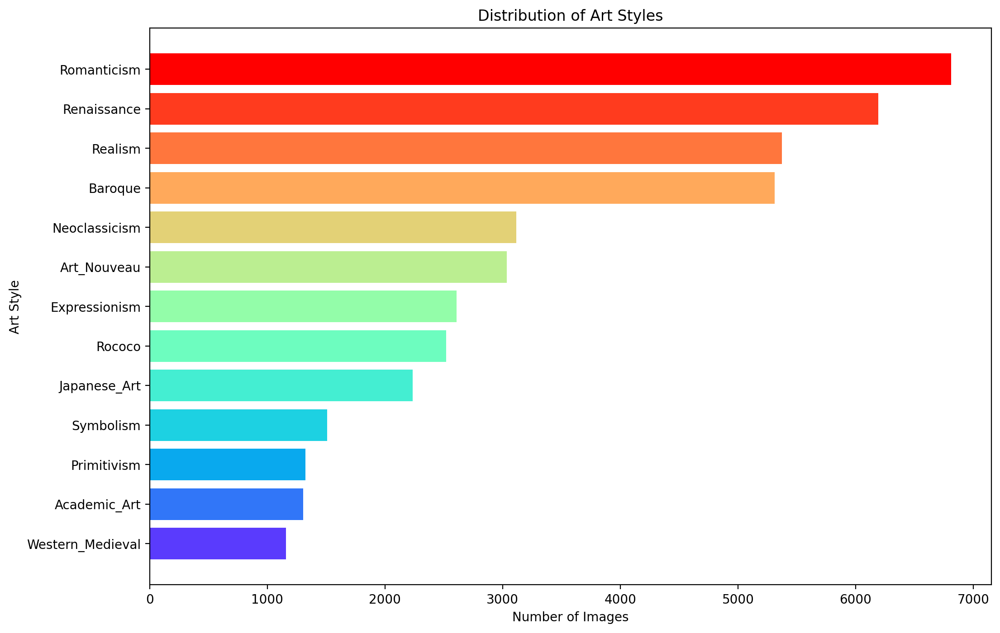

In [8]:

# Example usage
if __name__ == "__main__":
    current_path = os.getcwd()
    dataset = ArtDataset(root_dir='../data/raw', selected_styles=art_styles)

    plot_style_distribution(dataset.style_counts)


In [9]:
def display_random_images(dataset):
	styles = set(dataset.labels)
	fig = plt.figure(figsize=(20, 10), dpi=200)
	fig.subplots_adjust(hspace=.5)

	for i, style in enumerate(styles):
		ax = plt.subplot(2, 7, i + 1)
		img_path = dataset.get_random_image_by_style(style)
		image = Image.open(img_path)

		ax.imshow(image)
		ax.set_title(style)
		ax.axis('off')

	plt.tight_layout()
	plt.show()

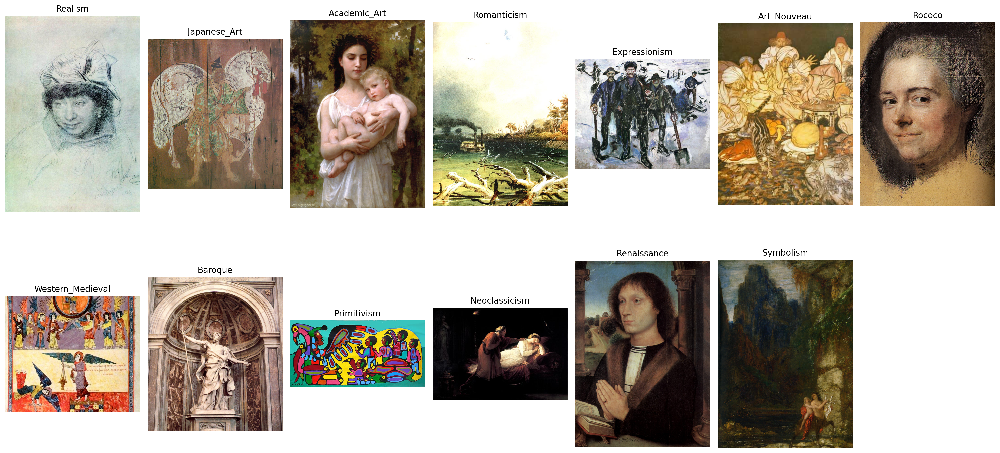

In [10]:
# Example usage
if __name__ == "__main__":
    current_path = os.getcwd()
    dataset = ArtDataset(root_dir='../data/raw', selected_styles=art_styles)

    display_random_images(dataset)


### Create a only three styles dataset

In [11]:
selected_styles = ["Baroque", "Symbolism", "Japanese_Art"]
num_images_per_style = 1000

# Create the dataset
current_path = os.getcwd()
dataset = ArtDataset(root_dir='../data/raw', 
                     selected_styles=selected_styles, 
                     num_images_per_style=num_images_per_style)

# Now dataset contains 1000 images from each of the specified styles
print(f"Total number of images in the dataset: {len(dataset)}")

Total number of images in the dataset: 3000


In [30]:
# There are some issues when using dataset to dataloader 
# images are only being converted to images when the __getitem__ constructor is called
# styles need to be mapped to int 
# best to have images and labels/targets as tensors

from torch.utils.data import DataLoader

dataloader = DataLoader(dataset = dataset, batch_size=64)
data_iter = iter(dataloader)

images,label = next(data_iter)

# Check how I did it in make_dataset.py

TypeError: default_collate: batch must contain tensors, numpy arrays, numbers, dicts or lists; found <class 'PIL.JpegImagePlugin.JpegImageFile'>